# Data Challenge

In [353]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

from glob import glob
from pathlib import Path
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, ConfusionMatrixDisplay, balanced_accuracy_score


## 1. Load the data

In [243]:
def read_participant_csv(file):
    return (pd.read_csv(file, header=None, names=['time_step', 'x', 'y', 'z'])
            .assign(participant=int(Path(file).stem)))


files = glob("dataset/*.csv")
df = pd.concat(map(read_participant_csv, files)).reset_index()

In [244]:
df.sample(5)

,index,time_step,x,y,z,participant
30067,3197,99.56,-4.52200,10.8420,0.23155,22
19091,2316,70.24,-4.39940,9.9565,-1.92050,1
6583,1647,51.43,3.63660,13.0210,1.41650,7
25957,2969,101.63,-1.98860,7.9270,0.95342,2
618,618,18.92,-0.84446,10.5690,1.18500,6


# 2. Analyze the data and visualize it

In [245]:
# Check if any participant has missing data
df.isnull().any(axis=1).sum()

0

In [246]:
# Check some statistics in each axis per participant
df.groupby('participant')[["x", "y", "z"]].describe()

x                                                           \
               count      mean       std      min      25%      50%       75%   
participant                                                                     
1             5069.0 -3.554254  2.486629  -9.3436 -5.28470 -3.48680 -2.179300   
2             3882.0 -0.537229  1.602373  -6.2381 -1.49820 -0.61292  0.381370   
3             1144.0  1.370715  1.596357  -2.1384  0.46309  1.14410  1.757000   
4             6981.0 -3.702193  2.377924 -13.7160 -5.20300 -3.90900 -1.988600   
5             1129.0 -1.645337  6.152952 -19.5720 -5.51620 -0.19068  1.757000   
6             4936.0  0.873680  1.703894  -3.4459 -0.10896  0.46309  1.334800   
7             3729.0  3.025053  2.458241  -7.4640  1.64810  3.02370  4.440200   
8             3457.0 -3.102341  2.305634 -10.1060 -4.24950 -3.17350 -2.029400   
9             7988.0 -0.284172  1.267059  -7.4367 -0.91256 -0.34051  0.231550   
10            3086.0 -3.284640  2.019642  -9.9156 -4.67180 -3.33700 -1.525500   
11            5636.0 -3.457045  2.473490 -10.8010 -4.94420 -3.44590 -1.947700   
12            4799.0 -2.203634  4.415305 -15.0910 -6.57180 -0.14982  0.885320   
13            6699.0 -0.325081  1.610489 -12.5310 -1.26670 -0.42223  0.572050   
14           12027.0 -1.483359  1.102077  -6.2109 -2.11120 -1.52550 -0.912560   
15            3653.0 -1.141034  1.804675  -6.4016 -2.41080 -1.26670 -0.272410   
16            1728.0 -1.355792  2.917691  -9.5342 -3.10540 -1.07600  0.081722   
17           21991.0 -2.545296  3.196954 -16.8480 -4.86250 -1.60720 -0.272410   
18           20758.0 -2.392799  3.205516 -13.1440 -4.14060 -2.45170 -0.803600   
19             911.0 -0.687970  1.484806  -5.4073 -1.49820 -0.95342 -0.000000   
20           16949.0 -0.237533  1.487338  -5.1349 -1.14410 -0.46309  0.313270   
21            3082.0 -0.246055  0.999954  -4.2904 -0.80360 -0.10896  0.381370   
22            9698.0 -2.657878  1.874682 -10.7600 -3.94990 -2.83300 -1.457400   

                            y            ...                         z  \
                 max    count      mean  ...      75%     max    count   
participant                              ...                             
1            10.9510   5069.0  8.557989  ...  10.6510  15.786   5069.0   
2             7.6683   3882.0  9.296086  ...   9.9565  19.041   3882.0   
3             7.8589   1144.0  8.913829  ...   9.8884  17.693   1144.0   
4             9.8884   6981.0  8.475791  ...  10.2700  17.965   6981.0   
5            15.1730   1129.0  3.266687  ...   7.0145  10.229   1129.0   
6             9.6160   4936.0  9.432396  ...  10.5690  17.775   4936.0   
7            11.5640   3729.0  8.572285  ...  10.6100  19.572   3729.0   
8            10.2700   3457.0  8.690122  ...   9.9565  18.960   3457.0   
9             8.0496   7988.0  9.283839  ...  10.1470  16.045   7988.0   
10            2.1520   3086.0  8.731872  ...  10.5290  14.519   3086.0   
11           11.7540   5636.0  8.589957  ...  10.1470  18.810   5636.0   
12            5.9793   4799.0  7.671019  ...   9.6568  15.432   4799.0   
13            6.3198   6699.0  9.072541  ...  11.0730  18.347   6699.0   
14            4.7535  12027.0  8.764041  ...   9.3844  14.560  12027.0   
15            7.4640   3653.0  9.238945  ...  11.5640  19.532   3653.0   
16           11.9590   1728.0  8.742231  ...  10.6510  17.243   1728.0   
17            8.6217  21991.0  8.279693  ...  10.3380  19.572  21991.0   
18           19.3140  20758.0  8.558407  ...  10.0790  19.423  20758.0   
19            6.3607    911.0  8.629187  ...  10.8010  19.082    911.0   
20            8.9213  16949.0  9.672159  ...  11.3050  18.088  16949.0   
21            4.6037   3082.0  9.317894  ...   9.7658  17.271   3082.0   
22            5.3256   9698.0  8.954836  ...  10.3790  18.537   9698.0   

                                                                               
                 mean       std      min      25%      50%    

In [247]:
for participant in sorted(df.participant.unique()):
    print(
        f"Participant {participant} frequency of measurement {int(1 / np.diff(df[df.participant == participant]['time_step']).mean())} Hz")

Participant 1 frequency of measurement 32 Hz
Participant 2 frequency of measurement 29 Hz
Participant 3 frequency of measurement 31 Hz
Participant 4 frequency of measurement 31 Hz
Participant 5 frequency of measurement 31 Hz
Participant 6 frequency of measurement 32 Hz
Participant 7 frequency of measurement 31 Hz
Participant 8 frequency of measurement 32 Hz
Participant 9 frequency of measurement 31 Hz
Participant 10 frequency of measurement 32 Hz
Participant 11 frequency of measurement 32 Hz
Participant 12 frequency of measurement 31 Hz
Participant 13 frequency of measurement 31 Hz
Participant 14 frequency of measurement 32 Hz
Participant 15 frequency of measurement 32 Hz
Participant 16 frequency of measurement 31 Hz
Participant 17 frequency of measurement 32 Hz
Participant 18 frequency of measurement 31 Hz
Participant 19 frequency of measurement 31 Hz
Participant 20 frequency of measurement 33 Hz
Participant 21 frequency of measurement 31 Hz
Participant 22 frequency of measurement 31 

Short summary:
* we can see that the data is not normalized
* the data is not balanced, some participants have more data than others
* there is no missing data
* the frequency of measurement is not constant, but roughly 30 Hz

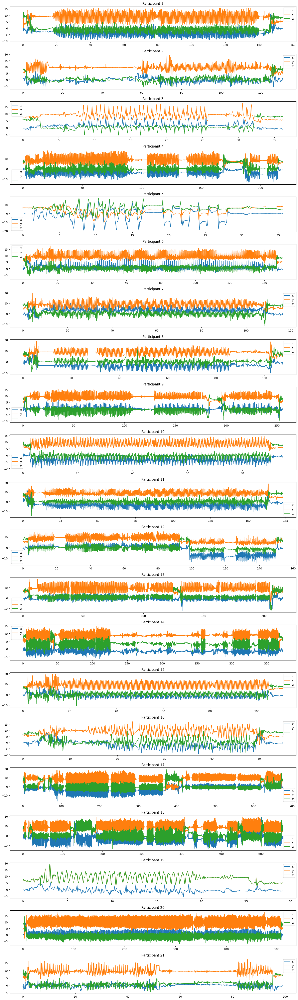

In [248]:
# plot data for each participant
fig, axes = plt.subplots(21, 1, figsize=(15, 50))

for participant, ax in zip(sorted(df.participant.unique()), axes):
    df[df.participant == participant].plot(x='time_step', y=['x', 'y', 'z'], ax=ax)
    ax.set_title(f'Participant {participant}')
    ax.set_xlabel('')

plt.tight_layout()
plt.show()

Each participant (x,y,z) domain vary in scale slightly. Let's normalize the data per participant

In [249]:
# normalize x, y, z to be between -1 and 1
def normalize(df):
    return (df - df.min()) / (df.max() - df.min()) * 2 - 1


df[['x_normalized', 'y_normalized', 'z_normalized']] = df[['x', 'y', 'z']]  # dummy assignment to fill in next loop

for i in df.participant.unique():
    df.loc[df.participant == i, ['x_normalized', 'y_normalized', 'z_normalized']] = df[df.participant == i][
        ['x', 'y', 'z']].apply(lambda x: normalize(x)).values

In [250]:
df.head(5)

,index,time_step,x,y,z,participant,x_normalized,y_normalized,z_normalized
0,0,0.000000,0.190680,6.5922,6.5514,6,-0.443177,-0.229066,0.597207
1,1,0.029480,0.108960,5.8567,6.6604,6,-0.455690,-0.309903,0.609653
2,2,0.061523,0.081722,6.7421,8.5808,6,-0.459861,-0.212591,0.828931
3,3,0.099396,-1.116900,8.8941,7.0145,6,-0.643390,0.023928,0.650085
4,4,0.129670,0.612920,7.5048,5.6661,6,-0.378525,-0.128765,0.496121


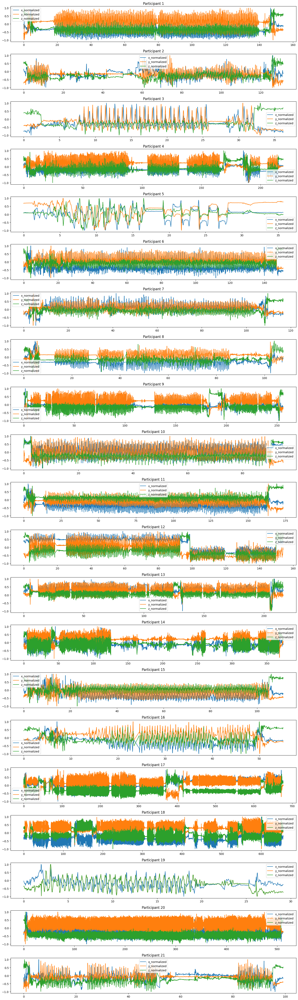

In [251]:
fig, axes = plt.subplots(21, 1, figsize=(15, 50))

for participant, ax in zip(sorted(df.participant.unique()), axes):
    df[df.participant == participant].plot(x='time_step', y=['x_normalized', 'y_normalized', 'z_normalized'], ax=ax)
    ax.set_title(f'Participant {participant}')
    ax.set_xlabel('')

plt.tight_layout()
plt.show()


## 3. Feature engineering for walking detection

So first we reduce dimensionality by PCA. This way we will have 1D signal on which we can detect motion.

In [354]:
pca = PCA(n_components=1)

df['pca'] = [None] * len(df)

for i in df.participant.unique():
    df.loc[df.participant == i, ['pca']] = pca.fit_transform(
        df[df.participant == i][['x_normalized', 'y_normalized', 'z_normalized']])

In [355]:
df.head(5)

,index,time_step,x,y,z,participant,x_normalized,y_normalized,z_normalized,pca,walking_flag,rolling_amplitude,rolling_amplitude_quantile,time_group
0,0,0.000000,0.190680,6.5922,6.5514,6,-0.443177,-0.229066,0.597207,-0.434877,False,NaN,0.197402,0.0
1,1,0.029480,0.108960,5.8567,6.6604,6,-0.455690,-0.309903,0.609653,-0.448868,False,NaN,0.197402,0.0
2,2,0.061523,0.081722,6.7421,8.5808,6,-0.459861,-0.212591,0.828931,-0.572763,False,NaN,0.197402,0.0
3,3,0.099396,-1.116900,8.8941,7.0145,6,-0.643390,0.023928,0.650085,-0.642452,False,NaN,0.197402,0.0
4,4,0.129670,0.612920,7.5048,5.6661,6,-0.378525,-0.128765,0.496121,-0.330443,False,NaN,0.197402,0.0


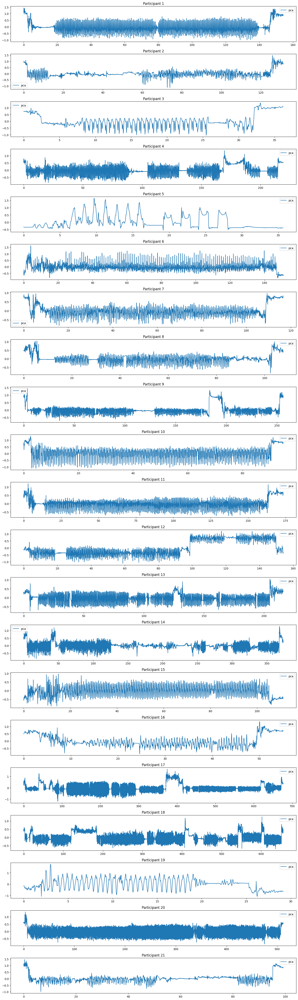

In [356]:
# plot each participant's pca in subplots
fig, axes = plt.subplots(21, 1, figsize=(15, 50))

for participant, ax in zip(sorted(df.participant.unique()), axes):
    df[df.participant == participant].plot(x='time_step', y='pca', ax=ax)
    ax.set_title(f'Participant {participant}')
    ax.set_xlabel('')

plt.tight_layout()
plt.show()

## 4. Detect walk

My initial proposition is to use a simple thresholding. We will set threshold on rolling standard deviation of the signal. Deviation seems to be correlated with movement. We will use quantile of the deviation per participant to set the threshold.

As an input signal we will take result of PCA and use reduced 1D signal to detect motion.

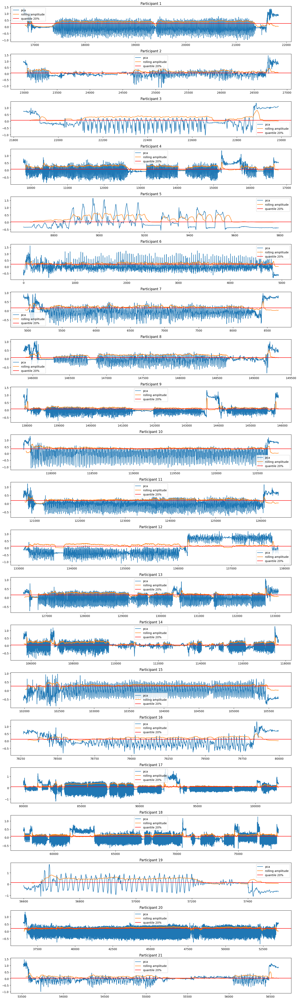

In [255]:
# plot each participant's pca in subplots
fig, axes = plt.subplots(21, 1, figsize=(15, 50))

for participant, ax in zip(sorted(df.participant.unique()), axes):
    frequency = int(1 / np.diff(df[df.participant == participant]["time_step"]).mean())
    rolling_amplitude = df[df.participant == participant]["pca"].rolling(frequency).std()
    pca = df[df.participant == participant]["pca"]
    ax.plot(pca, label="pca")
    ax.plot(rolling_amplitude, label="rolling amplitude")

    ax.axhline(y=rolling_amplitude.quantile(.2), color='r', linestyle='-', label="quantile 20%")
    # ax.axhline(y = rolling_amplitude.quantile(.3), color = 'b', linestyle = '-', label="quantile 30%")
    # ax.axhline(y = rolling_amplitude.quantile(.4), color = 'g', linestyle = '-', label="quantile 40%")

    ax.set_title(f'Participant {participant}')
    ax.set_xlabel('')
    ax.legend()

plt.tight_layout()
plt.show()

### Justification

Pros:
* very easy to implement.
* no need to train any model.
* we can easily interpret the results.

Cons:
* we need to set the threshold manually, and although it is set to quantile, it is still a manual process.
* there will be some problems with historical data storage (threshold is set based on rolling window of the signal, so it will change over time)
* problem with fresh start (we need to have some data to set the threshold)

Other methods:
* we could learn some patterns on all participants and then use them to detect motion. This would be more robust, but it would require more data and more time to train the model.
* we could have couple thresholds (based on other participants) and then use some "voting mechanism" to decide if the participant is walking or not.
* we could transform accelerometer data to frequency domain and then use some thresholding on that - I did not explore this option, due to lack of knowladge in that type of signal processing (I guess we could use some Fast Fourier Transform, but I'm not an expert in that field).

## 5. Classify participants by their walking

We need to mark walking segments for each participant. We will use method described in previous section. We will use 20% quantile of rolling standard deviation of the signal as a threshold.

In [270]:
df["walking_flag"] = [None] * len(df)
df["rolling_amplitude"] = [None] * len(df)
df["rolling_amplitude_quantile"] = [None] * len(df)

for participant in sorted(df.participant.unique()):
    frequency = int(1 / np.diff(df[df.participant == participant]["time_step"]).mean())
    df.loc[df.participant == participant, ["rolling_amplitude"]] = df[df.participant == participant]["pca"].rolling(
        frequency).std()
    df.loc[df.participant == participant, ["rolling_amplitude_quantile"]] = df[df.participant == participant][
        "rolling_amplitude"].quantile(.2)
    df.loc[df.participant == participant, ["walking_flag"]] = (df[df.participant == participant]["rolling_amplitude"] >
                                                               df[df.participant == participant][
                                                                   "rolling_amplitude_quantile"]) & (
                                                                  df[df.participant == participant][
                                                                      "rolling_amplitude"].notnull())

In [271]:
df.head(10)

,index,time_step,x,y,z,participant,x_normalized,y_normalized,z_normalized,pca,walking_flag,rolling_amplitude,rolling_amplitude_quantile
0,0,0.000000,0.190680,6.5922,6.5514,6,-0.443177,-0.229066,0.597207,-0.434877,False,NaN,0.197402
1,1,0.029480,0.108960,5.8567,6.6604,6,-0.455690,-0.309903,0.609653,-0.448868,False,NaN,0.197402
2,2,0.061523,0.081722,6.7421,8.5808,6,-0.459861,-0.212591,0.828931,-0.572763,False,NaN,0.197402
3,3,0.099396,-1.116900,8.8941,7.0145,6,-0.643390,0.023928,0.650085,-0.642452,False,NaN,0.197402
4,4,0.129670,0.612920,7.5048,5.6661,6,-0.378525,-0.128765,0.496121,-0.330443,False,NaN,0.197402
5,5,0.159450,1.334800,7.5457,8.3493,6,-0.267993,-0.124270,0.802497,-0.399858,False,NaN,0.197402
6,6,0.191590,2.301800,7.2733,7.6274,6,-0.119929,-0.154209,0.720068,-0.229575,False,NaN,0.197402
7,7,0.229460,-0.803600,6.5105,6.8238,6,-0.595419,-0.238046,0.628311,-0.579881,False,NaN,0.197402
8,8,0.259770,-0.000000,6.8919,7.5457,6,-0.472374,-0.196127,0.710740,-0.521212,False,NaN,0.197402
9,9,0.290310,-0.762740,6.2381,8.0496,6,-0.589162,-0.267984,0.768276,-0.64776,False,NaN,0.197402


In [272]:
# separating walking signals into 2 second-long segments per participant
def add_time_group(dataf, time_window=2):
    return (dataf
            .assign(time_group=lambda d: d.time_step.astype(int) // time_window))


for participant in sorted(df.participant.unique()):
    df.loc[df.participant == participant, ["time_group"]] = add_time_group(df[df.participant == participant])[
        "time_group"]

We should have 2 second-long segments of signals. Out of all of them we will take only those that are walking. We will use those to train our model.

In [357]:
only_walking_df = df[df.walking_flag == True]

In [360]:
# compare raw and filtered data for first participant
pd.merge(df[df.participant == 1].groupby("time_group").count()["time_step"], only_walking_df[only_walking_df.participant == 1].groupby("time_group").count()["time_step"], left_index=True, right_index=True, how="outer").rename(
    columns={"time_step_x": "raw", "time_step_y": "filtered"})

,raw,filtered
time_group,,
0.0,66,NaN
1.0,64,45.0
2.0,64,42.0
3.0,67,NaN
4.0,66,NaN
...,...,...
73.0,63,29.0
74.0,60,8.0
75.0,51,NaN


Slight cleaning of the data. We will remove all segments that are shorter than 2 seconds (for simplicity we will assume that 60 samples is 2 seconds).

In [318]:
to_merge = only_walking_df.groupby(["participant", "time_group"]).count()["time_step"].reset_index()
to_merge.rename(columns={"time_step": "count"}, inplace=True)
to_merge = to_merge[to_merge["count"] >= 60]

In [319]:
only_walking_df_filtered = pd.merge(only_walking_df, to_merge, how='inner', on=['participant', 'time_group'])

In [320]:
for i in sorted(only_walking_df_filtered.participant.unique()):
    print(
        f"Participant {i} has {len(only_walking_df_filtered[only_walking_df_filtered.participant == i]['time_group'].value_counts())} samples")

Participant 1 has 57 samples
Participant 2 has 32 samples
Participant 3 has 9 samples
Participant 4 has 75 samples
Participant 5 has 10 samples
Participant 6 has 26 samples
Participant 7 has 38 samples
Participant 8 has 33 samples
Participant 9 has 78 samples
Participant 10 has 20 samples
Participant 11 has 49 samples
Participant 12 has 35 samples
Participant 13 has 66 samples
Participant 14 has 119 samples
Participant 15 has 37 samples
Participant 16 has 15 samples
Participant 17 has 226 samples
Participant 18 has 217 samples
Participant 19 has 7 samples
Participant 20 has 154 samples
Participant 21 has 26 samples
Participant 22 has 84 samples


Each participant has at least 5 of 2 second-long segments of walking signals.

Once again let's start from very naive approach. We will use only some statistics from 2 second-long segments of walking signals to classify participants. We will use mean, standard deviation, min and max of each axis for each signal window.

In [348]:
to_classify = only_walking_df_filtered.groupby(['participant', 'time_group'], as_index=False).agg(x_mean=('x', 'mean'),
                                                                                                  x_median=(
                                                                                                      'x', 'median'),
                                                                                                  x_sd=('x', 'std'),
                                                                                                  x_min=('x', 'min'),
                                                                                                  x_max=('x', 'max'),
                                                                                                  y_mean=('y', 'mean'),
                                                                                                  y_median=(
                                                                                                      'y', 'median'),
                                                                                                  y_sd=('y', 'std'),
                                                                                                  y_min=('y', 'min'),
                                                                                                  y_max=('y', 'max'),
                                                                                                  z_mean=('z', 'mean'),
                                                                                                  z_median=(
                                                                                                      'z', 'median'),
                                                                                                  z_sd=('z', 'std'),
                                                                                                  z_min=('z', 'min'),
                                                                                                  z_max=('z', 'max'),
                                                                                                  time_mean_diff=(
                                                                                                      'time_step',
                                                                                                      lambda
                                                                                                          x: x.diff().mean()))

X = to_classify.drop(columns=["participant", "time_group"])
y = to_classify["participant"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [349]:
pd.merge(y_train.value_counts(), y_test.value_counts(), left_index=True, right_index=True).rename(
    columns={"participant_x": "train", "participant_y": "test"})

,train,test
17,181,45
18,173,44
20,123,31
14,95,24
22,67,17
9,62,16
4,60,15
13,53,13
1,46,11
11,39,10


In [350]:
random_forest_clf = RandomForestClassifier(random_state=42)
random_forest_clf.fit(X_train, y_train)

y_pred = random_forest_clf.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        11
           2       0.75      0.50      0.60         6
           3       1.00      1.00      1.00         2
           4       0.88      0.93      0.90        15
           5       0.67      1.00      0.80         2
           6       1.00      0.80      0.89         5
           7       0.89      1.00      0.94         8
           8       1.00      0.43      0.60         7
           9       0.84      1.00      0.91        16
          10       1.00      1.00      1.00         4
          11       0.90      0.90      0.90        10
          12       1.00      1.00      1.00         7
          13       1.00      1.00      1.00        13
          14       0.85      0.96      0.90        24
          15       1.00      0.71      0.83         7
          16       1.00      0.67      0.80         3
          17       0.98      0.89      0.93        45
          18       0.91    

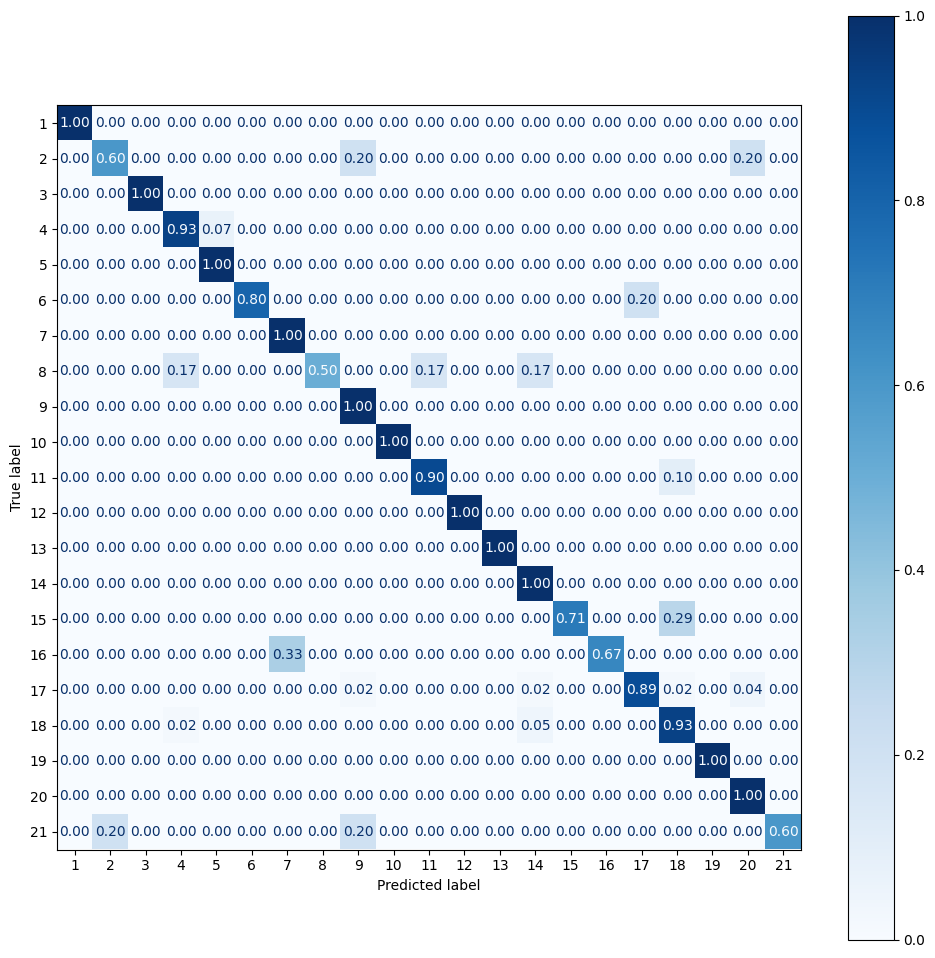

In [351]:
disp = ConfusionMatrixDisplay.from_predictions(
    y_test,
    y_pred,
    labels=range(1, 22),
    cmap=plt.cm.Blues,
    values_format='.2f',
    normalize='true',
)
fig = disp.ax_.get_figure()
fig.set_figwidth(12)
fig.set_figheight(12)
plt.show()

In [352]:
print(f"Balanced accuracy score for a given model: {balanced_accuracy_score(y_test, y_pred):.2f}")

Balanced accuracy score for a given model: 0.88


Model seems to be surprisingly good for such a simple approach. We achieve 88% (balanced) accuracy without any sophisticated feature engineering and fine-tuning of hyperparameters.

There are some caveats though. For some participants we have only small amount of samples. We could try to use more techniques like cross-validation or grid search for better parameters to improve current model.

There are still many ways to improve our model even with simpler models like XGBoost or Dynamic Time Warping.
We could also try to use more sophisticated models like neural networks ([LSTM](https://www.nature.com/articles/s41598-021-86432-7), [CNN](https://arxiv.org/pdf/1809.04356.pdf) etc.) or more feature engineering techniques like PCA, ICA or FFT.

Due to the time constraints I will stop here. If you have any questions or suggestions please let me know.